In [1]:
# data manipulation
import pandas as pd
import numpy as np

# data viz
import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sns

# apply some cool styling
plt.style.use('ggplot')
sns.set_style('darkgrid')

# Initialization

## Raw Data

In [2]:
path = '../../Data/Dataset/cannai_dataset.csv'
df = pd.read_csv(path)

In [3]:
df.head(3)

,RId,Id,Date,Time,PAR,DailyLightIntegral,Temperature,RH,VaporPressureDeficit,Name,SoilTemperature,Permittivity,RawEC,VolumeWaterContent,BulkEC,PoreWaterEC,CropCycle
0,16040987,9581101,7/27/2021,5:18:25,0.0,43370275,22.18,75.0,0.67,Sonda 1,23.17,1.76,0.0,0.019,0.0,0.0,1
1,16040987,9581101,7/27/2021,5:18:25,0.0,43370275,22.18,75.0,0.67,Sonda 2,22.82,1.47,0.0,0.013,0.0,0.0,1
2,16040987,9581104,7/27/2021,5:19:29,0.0,43370275,22.33,75.0,0.67,Sonda 1,23.23,1.85,0.0,0.022,0.0,0.0,1


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 750590 entries, 0 to 750589
Data columns (total 17 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   RId                   750590 non-null  int64  
 1   Id                    750590 non-null  int64  
 2   Date                  750590 non-null  object 
 3   Time                  750590 non-null  object 
 4   PAR                   750590 non-null  float64
 5   DailyLightIntegral    750590 non-null  int64  
 6   Temperature           750590 non-null  float64
 7   RH                    750590 non-null  float64
 8   VaporPressureDeficit  750590 non-null  float64
 9   Name                  750590 non-null  object 
 10  SoilTemperature       750572 non-null  float64
 11  Permittivity          750572 non-null  float64
 12  RawEC                 750572 non-null  float64
 13  VolumeWaterContent    750572 non-null  float64
 14  BulkEC                750572 non-null  float64
 15  

In [5]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
RId,750590.0,2.720330e+07,3.785938e+07,15998911.00,1.599891e+07,1.604099e+07,1.604099e+07,1.553556e+08
Id,750590.0,1.427661e+07,4.209420e+06,9527073.00,1.131356e+07,1.305876e+07,1.565850e+07,2.460451e+07
PAR,750590.0,1.974291e+02,3.373236e+02,0.00,0.000000e+00,7.340000e+00,2.303900e+02,2.088890e+03
DailyLightIntegral,750590.0,7.056561e+06,1.471186e+07,0.00,1.430000e+02,2.331417e+06,8.611986e+06,2.623142e+08
Temperature,750590.0,2.304973e+01,6.572870e+00,7.10,1.859000e+01,2.266000e+01,2.617000e+01,4.890000e+01
RH,750590.0,6.414071e+01,2.005814e+01,10.00,4.900000e+01,6.700000e+01,7.900000e+01,1.000000e+02
VaporPressureDeficit,750590.0,1.288762e+00,1.260882e+00,0.00,4.800000e-01,9.100000e-01,1.580000e+00,9.540000e+00
SoilTemperature,750572.0,2.316806e+01,4.691260e+00,7.67,2.040000e+01,2.353000e+01,2.579000e+01,4.369000e+01
Permittivity,750572.0,1.317225e+01,9.574990e+00,0.88,4.980000e+00,1.263000e+01,1.960000e+01,6.426000e+01
RawEC,750572.0,1.959405e+02,2.021043e+02,0.00,3.200000e+01,1.390000e+02,2.920000e+02,1.650000e+03


## Daily Summary

In [6]:
target_path = '../../Data/Dataset_TargetVariables/cannai_disease_dataset.csv'
df_plus_disease = pd.read_csv(target_path)

In [7]:
df_plus_disease.head(3)

,CropCycle,RId,Name,Date,Day_cycle,sun_time,PAR,DailyLightIntegral,T_min,T_mean,...,Permittivity_mean,RawEC_median,VolumeWaterContent_min,VolumeWaterContent_mean,VolumeWaterContent_max,BulkEC_median,PoreWaterEC_min,PoreWaterEC_mean,PoreWaterEC_max,Disease
0,1,16040987,Sonda 1,2021-07-28,1,12.291944,1052.274563,262314157.0,16.75,26.495946,...,6.42,70.769884,0.070,0.144805,0.327,7.076988,0.0,145.511197,485.1,0
1,1,15998911,Sonda 1,2021-07-28,1,12.167222,966.344766,38190525.0,17.95,28.435435,...,6.20,117.781567,0.000,0.124374,0.411,11.778157,0.0,150.879028,759.2,0
2,1,15998911,Sonda 2,2021-07-28,1,12.167222,966.344766,38190525.0,17.95,28.435435,...,4.79,37.929608,0.034,0.102315,0.210,3.792961,0.0,68.833454,306.0,0


In [8]:
df_plus_disease.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1560 entries, 0 to 1559
Data columns (total 30 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   CropCycle                  1560 non-null   int64  
 1   RId                        1560 non-null   int64  
 2   Name                       1560 non-null   object 
 3   Date                       1560 non-null   object 
 4   Day_cycle                  1560 non-null   int64  
 5   sun_time                   1560 non-null   float64
 6   PAR                        1560 non-null   float64
 7   DailyLightIntegral         1560 non-null   float64
 8   T_min                      1560 non-null   float64
 9   T_mean                     1560 non-null   float64
 10  T_max                      1560 non-null   float64
 11  R_H_min                    1560 non-null   float64
 12  RH_mean                    1560 non-null   float64
 13  RH_max                     1560 non-null   float

In [9]:
df_plus_disease.describe().T

,count,mean,std,min,25%,50%,75%,max
CropCycle,1560.0,2.310256e+00,7.435141e-01,1.000000e+00,2.000000e+00,2.000000e+00,3.000000e+00,3.000000e+00
RId,1560.0,7.228850e+07,6.839066e+07,1.599891e+07,1.599891e+07,1.604099e+07,1.553555e+08,1.553556e+08
Day_cycle,1560.0,4.651346e+01,3.277517e+01,1.000000e+00,2.100000e+01,4.200000e+01,6.200000e+01,1.370000e+02
sun_time,1560.0,1.285923e+01,2.650584e+00,9.602778e-01,1.194444e+01,1.203083e+01,1.283528e+01,2.394111e+01
PAR,1560.0,2.154799e+02,1.795306e+02,6.354177e-01,1.088047e+02,1.649396e+02,2.275735e+02,1.052275e+03
DailyLightIntegral,1560.0,1.098009e+07,1.628073e+07,0.000000e+00,4.603251e+06,7.171736e+06,1.227486e+07,2.623142e+08
T_min,1560.0,1.966064e+01,4.191163e+00,7.100000e+00,1.666000e+01,2.028500e+01,2.342000e+01,2.594000e+01
T_mean,1560.0,2.354635e+01,2.929626e+00,1.433348e+01,2.204702e+01,2.450951e+01,2.543802e+01,3.251138e+01
T_max,1560.0,2.842914e+01,5.000063e+00,1.753000e+01,2.561000e+01,2.660000e+01,2.962250e+01,4.890000e+01
R_H_min,1560.0,5.227213e+01,1.618646e+01,1.000000e+01,4.000000e+01,5.800000e+01,6.518000e+01,8.000000e+01


In [10]:
# Parsing the Date column into a datetime object
df.Date = pd.to_datetime(df.Date)
df_plus_disease.Date = pd.to_datetime(df_plus_disease.Date)

## Merging

In [11]:
disease_df = pd.merge(df, df_plus_disease[['CropCycle', 'RId', 'Name', 'Date', 'Disease']],
                      how='left', on=['CropCycle', 'RId', 'Name', 'Date'])

In [12]:
disease_df.dropna(inplace=True)

In [13]:
# From Date and Time to DateTime
disease_df['DateTime'] = pd.to_datetime(disease_df.Date.dt.strftime('%Y-%m-%d') + ' ' + disease_df.Time)
disease_df.drop(columns=['Date', 'Time'], inplace=True)

## Adding Plant column to disease_df

In [14]:
CropCycle = disease_df.CropCycle.map(str)
RId = disease_df.RId.map(str)
Name = disease_df.Name
disease_df['Plant'] = CropCycle + '-' + RId + '-' + Name

from sklearn.preprocessing import LabelEncoder
enc = LabelEncoder()
disease_df.Plant = enc.fit_transform(disease_df.Plant) + 1

disease_df.to_csv('data_and_target.csv')
disease_df.head(3)

,RId,Id,PAR,DailyLightIntegral,Temperature,RH,VaporPressureDeficit,Name,SoilTemperature,Permittivity,RawEC,VolumeWaterContent,BulkEC,PoreWaterEC,CropCycle,Disease,DateTime,Plant
1250,16040987,9547690,0.0,0,20.42,68.0,0.77,Sonda 1,24.22,3.90,26.0,0.077,2.6,0.0,1,0.0,2021-07-28 00:00:22,3
1251,16040987,9547690,0.0,0,20.42,68.0,0.77,Sonda 2,25.14,4.17,44.0,0.075,4.4,0.0,1,0.0,2021-07-28 00:00:22,4
1252,16040987,9547718,0.0,0,20.39,68.0,0.77,Sonda 1,24.22,3.66,26.0,0.070,2.6,0.0,1,0.0,2021-07-28 00:01:27,3


# Healthy and Sick plants Comparison

In [15]:
disease_0 = disease_df.query('Disease == 0').describe().T.reset_index()
disease_1 = disease_df.query('Disease == 1').describe().T.reset_index()

In [16]:
disease_stats = pd.merge(disease_0, disease_1, on='index', suffixes=['_0', '_1'])
cols_order = ['index'] + [col + '_' + str(i) for col in disease_0.columns[1:] for i in range(2)]
disease_stats  = disease_stats[cols_order].rename(columns={'index': 'variable'})
disease_stats.iloc[2:].iloc[:-3]

,variable,count_0,count_1,mean_0,mean_1,std_0,std_1,min_0,min_1,25%_0,25%_1,50%_0,50%_1,75%_0,75%_1,max_0,max_1
2,PAR,706318.0,41714.0,1.988959e+02,1.519600e+02,3.385160e+02,2.647662e+02,0.00,0.00,0.000,0.000,7.335,7.780,231.330,197.430,2.059890e+03,1.895830e+03
3,DailyLightIntegral,706318.0,41714.0,7.102363e+06,5.082167e+06,1.481027e+07,6.158043e+06,0.00,0.00,112.000,3558.000,2314363.000,2577495.000,8671863.750,7676848.000,2.623142e+08,3.884889e+07
4,Temperature,706318.0,41714.0,2.307645e+01,2.212245e+01,6.555944e+00,6.488913e+00,7.10,7.64,18.580,18.640,22.750,21.570,26.170,25.480,4.890000e+01,4.134000e+01
5,RH,706318.0,41714.0,6.453916e+01,5.876526e+01,2.011155e+01,1.776800e+01,10.00,20.00,49.000,44.000,67.000,59.000,79.000,74.000,1.000000e+02,9.400000e+01
6,VaporPressureDeficit,706318.0,41714.0,1.279740e+00,1.336018e+00,1.264445e+00,1.073556e+00,0.00,0.06,0.470,0.580,0.900,1.070,1.560,1.700,9.540000e+00,5.980000e+00
7,SoilTemperature,706318.0,41714.0,2.318566e+01,2.248325e+01,4.649033e+00,5.134697e+00,7.67,8.51,20.420,20.110,23.510,23.400,25.770,25.520,4.369000e+01,3.652000e+01
8,Permittivity,706318.0,41714.0,1.312966e+01,1.437513e+01,9.548546e+00,1.002320e+01,0.88,0.88,5.015,4.330,12.490,15.950,19.490,20.590,6.426000e+01,3.856000e+01
9,RawEC,706318.0,41714.0,1.947428e+02,2.249373e+02,2.026992e+02,1.926026e+02,0.00,0.00,32.000,23.000,135.000,232.000,290.000,331.000,1.650000e+03,7.890000e+02
10,VolumeWaterContent,706318.0,41714.0,2.246441e-01,2.469772e-01,1.437774e-01,1.547387e-01,0.00,0.00,0.103,0.121,0.217,0.267,0.349,0.363,6.060000e-01,5.770000e-01
11,BulkEC,706318.0,41714.0,1.947428e+01,2.249373e+01,2.026992e+01,1.926026e+01,0.00,0.00,3.200,2.300,13.500,23.200,29.000,33.100,1.650000e+02,7.890000e+01


In [17]:
describe_diff = disease_0.iloc[:, 2:] - disease_1.iloc[:, 2:]
pd.concat([disease_stats.variable, describe_diff], axis=1).iloc[2:].iloc[:-3]

,variable,mean,std,min,25%,50%,75%,max
2,PAR,4.693592e+01,7.374984e+01,0.00,0.000,-0.445,33.900,1.640600e+02
3,DailyLightIntegral,2.020195e+06,8.652223e+06,0.00,-3446.000,-263132.000,995015.750,2.234653e+08
4,Temperature,9.539997e-01,6.703029e-02,-0.54,-0.060,1.180,0.690,7.560000e+00
5,RH,5.773900e+00,2.343544e+00,-10.00,5.000,8.000,5.000,6.000000e+00
6,VaporPressureDeficit,-5.627820e-02,1.908883e-01,-0.06,-0.110,-0.170,-0.140,3.560000e+00
7,SoilTemperature,7.024109e-01,-4.856640e-01,-0.84,0.310,0.110,0.250,7.170000e+00
8,Permittivity,-1.245464e+00,-4.746506e-01,0.00,0.685,-3.460,-1.100,2.570000e+01
9,RawEC,-3.019447e+01,1.009659e+01,0.00,9.000,-97.000,-41.000,8.610000e+02
10,VolumeWaterContent,-2.233310e-02,-1.096123e-02,0.00,-0.018,-0.050,-0.014,2.900000e-02
11,BulkEC,-3.019447e+00,1.009659e+00,0.00,0.900,-9.700,-4.100,8.610000e+01


## Plants' Health Evolution

In [18]:
n_plants = len(disease_df.Plant.unique())
sick_plants = sorted(disease_df.query('Disease == 1').Plant.unique())

print(disease_df.query('Disease == 1').groupby(['CropCycle', 'Plant']).size())
print(f'\n{len(sick_plants)} sick plants: {sick_plants} among the {n_plants} studied.')

CropCycle  Plant
1          1        5102
           2        5102
           3        5002
           4        5002
2          5        5459
           6        5459
           7        5294
           8        5294
dtype: int64

8 sick plants: [1, 2, 3, 4, 5, 6, 7, 8] among the 18 studied.


In [19]:
def disease_plot(df, CropCycle):
    if CropCycle not in df.CropCycle.unique():
        print('Invalid CropCycle value')
        return
    
    if len(df) == 748032: date_var = 'DateTime'
    elif len(df) == 1560: date_var = 'Date'
    
    CropCycle_data = df.query('CropCycle == @CropCycle')
    Plants = sorted(CropCycle_data.Plant.unique())
    n = len(Plants)
    
    fig, ax = plt.subplots(n, 1, figsize=(16, 4*n))
    fig.subplots_adjust(hspace=.1)

    for i, Plant in enumerate(Plants):
        data = CropCycle_data.query('Plant == @Plant')
        ax[i].plot(data[date_var], data.Disease, color='gray')
        ax[i].yaxis.set_ticks(ticks=[0, 1], labels=['Healthy', 'Sick'])
        plt.text(x=.03, y=.85, s=f'Plant {Plant}', transform=ax[i].transAxes, fontsize=16)

    for i in range(n-1):
        ax[i].xaxis.set_ticklabels([])

    plt.suptitle(f'Crop Cycle {CropCycle} Disease Report', y=.9, fontsize=24, fontweight=600)
    plt.savefig(f'crop_cycle_{CropCycle}_disease_report.png')
    plt.show()

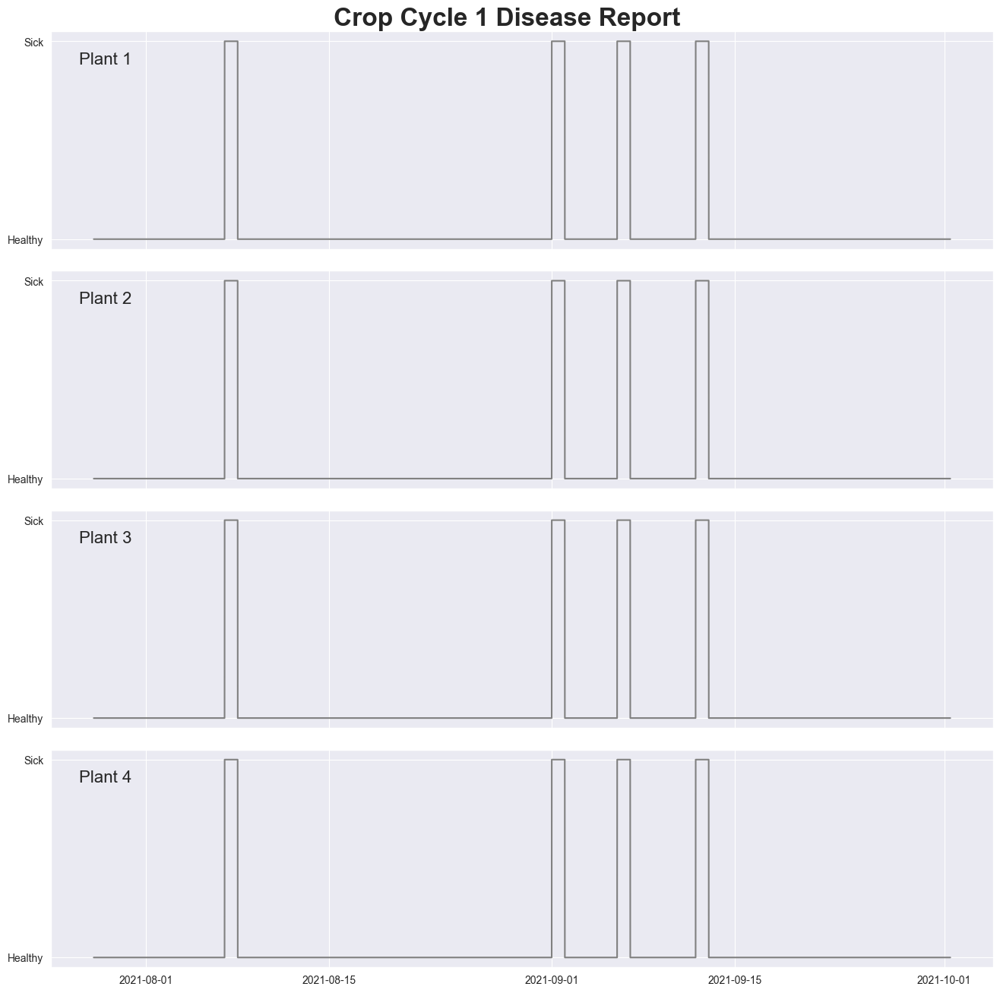

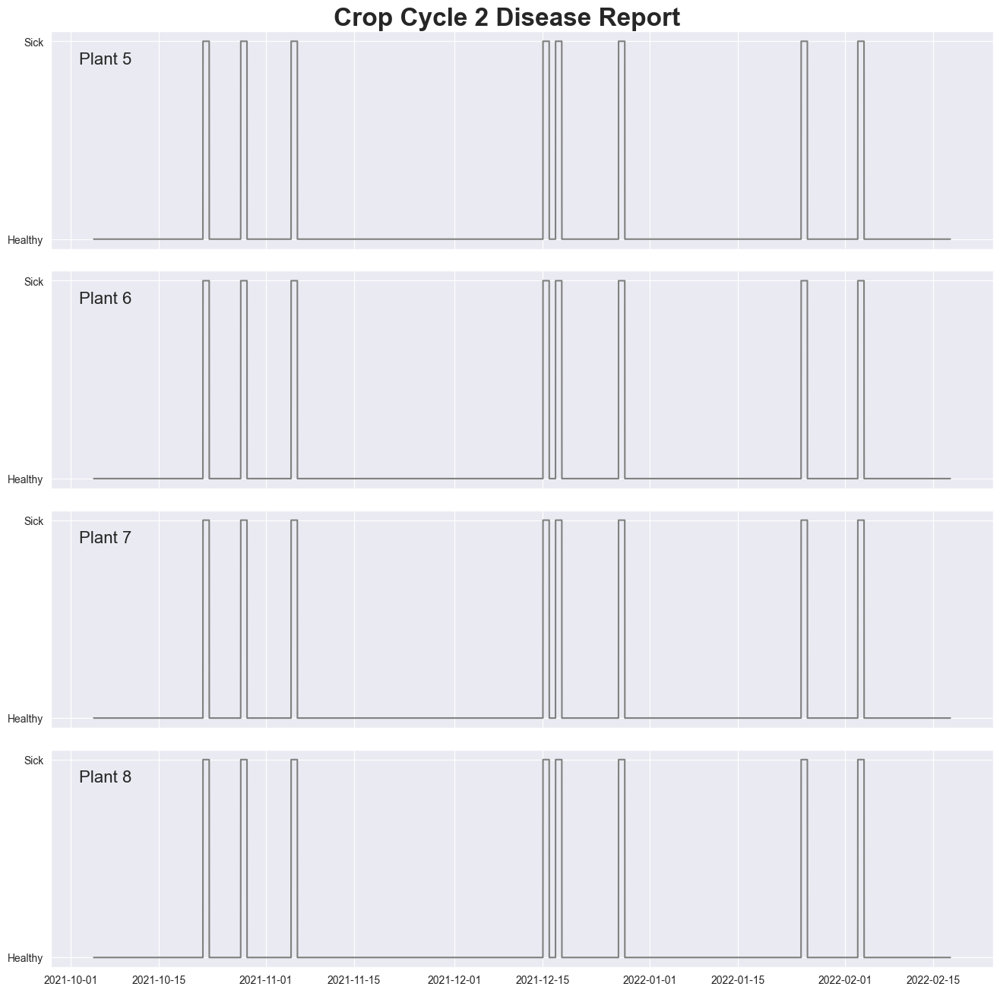

In [20]:
disease_plot(df=disease_df, CropCycle=1)
disease_plot(df=disease_df, CropCycle=2)

In [21]:
disease_dates = []
for disease_date in disease_df.query('Disease == 1').DateTime.map(str):
    if disease_date[:10] not in disease_dates:
        disease_dates.append(disease_date[:10])
disease_dates

['2021-08-07',
 '2021-09-01',
 '2021-09-06',
 '2021-09-12',
 '2021-10-22',
 '2021-10-28',
 '2021-11-05',
 '2021-12-15',
 '2021-12-17',
 '2021-12-27',
 '2022-01-25',
 '2022-02-03']

In [22]:
num_vars = ['PAR', 'DailyLightIntegral', 'Temperature', 'RH', 'VaporPressureDeficit',
            'SoilTemperature', 'Permittivity', 'RawEC', 'VolumeWaterContent', 'BulkEC', 'PoreWaterEC']

In [23]:
def disease_plot(plant, feature):
    if plant not in disease_df.Plant.unique():
        print('Invalid plant value')
        return
    if feature not in num_vars:
        print('Invalid feature')
        return
    
    plant_data = disease_df.query('Plant == @plant')
    
    fig, ax = plt.subplots(figsize=(16, 4))
    ax.plot(plant_data.DateTime, plant_data[feature], color='gray', label='Healthy')
    
    y = np.ma.masked_where(plant_data['Disease'] == 0, plant_data[feature])
    ax.plot(plant_data.DateTime, y, color='red', label='Sick')

    plt.legend()
    plt.title(f'Plant {plant} {feature} Report', y=.98, fontsize=24, fontweight=600)
    plt.savefig(f'plant_{plant}_{feature}_disease_report.png')
    plt.show()

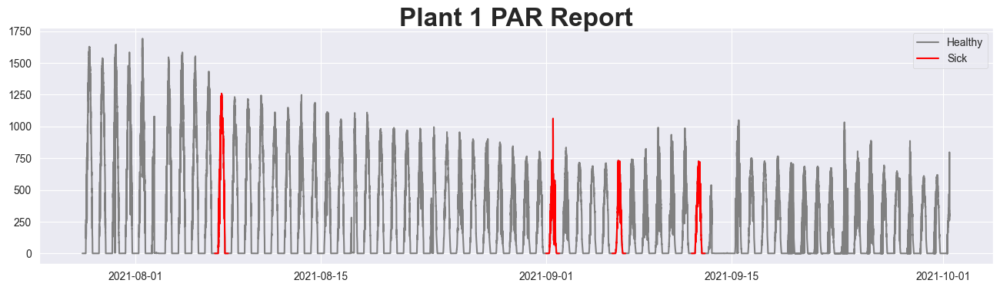

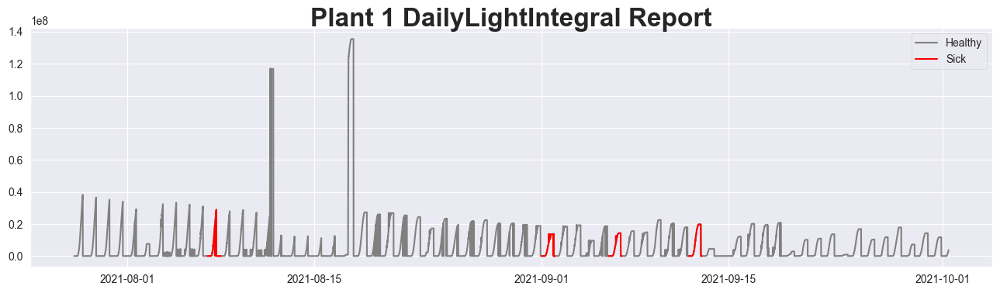

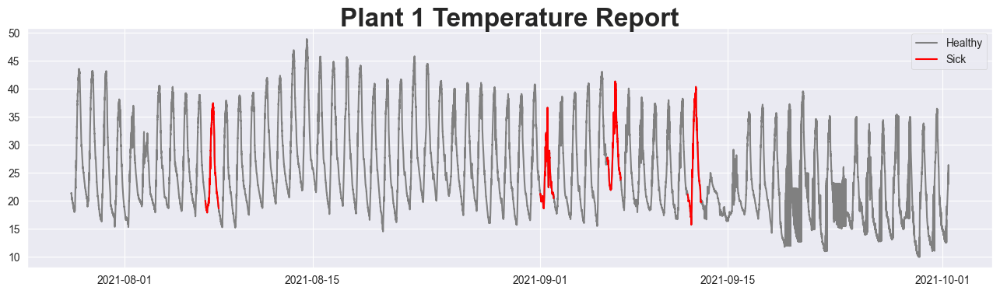

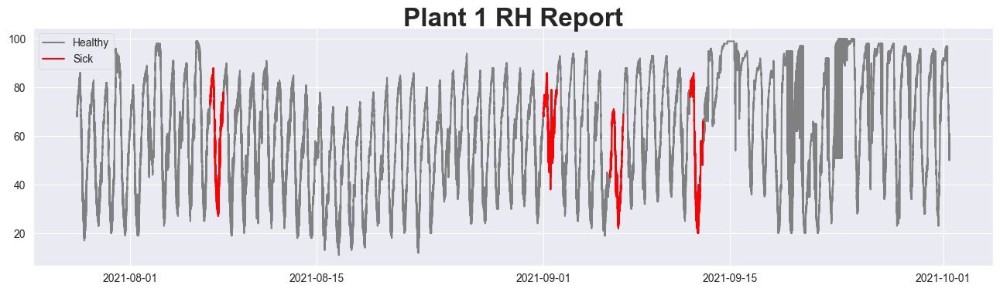

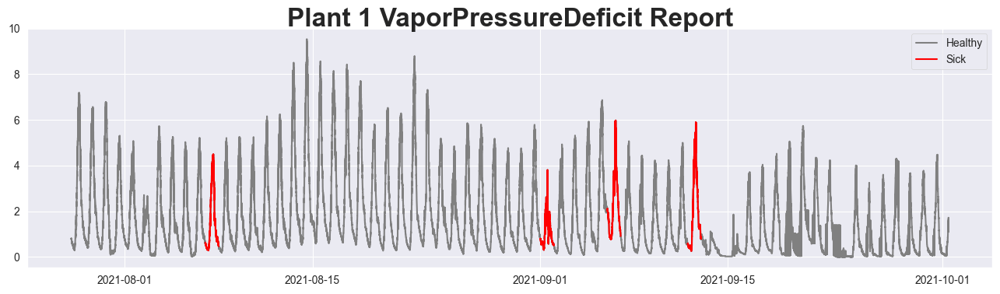

...

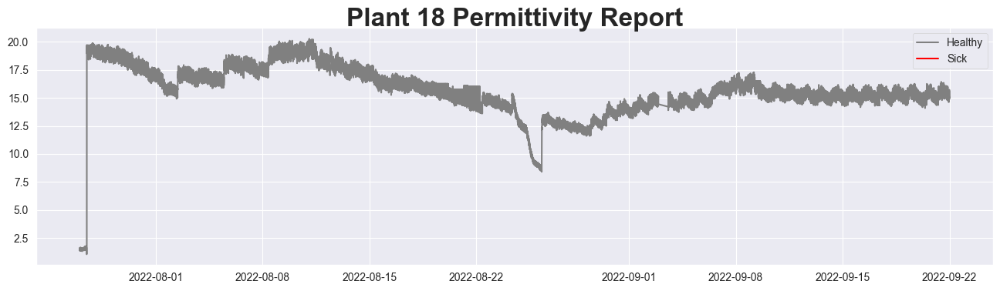

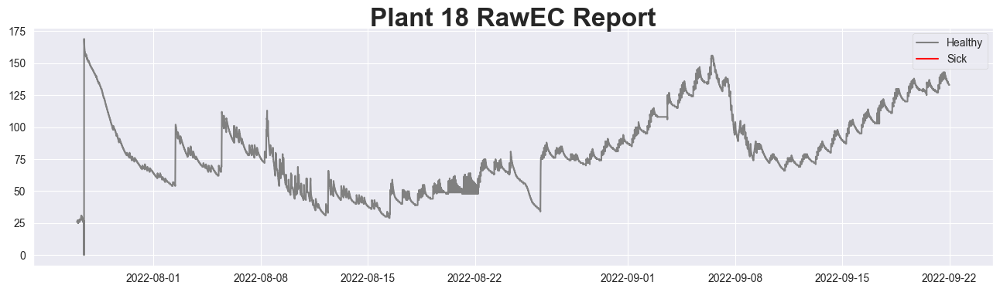

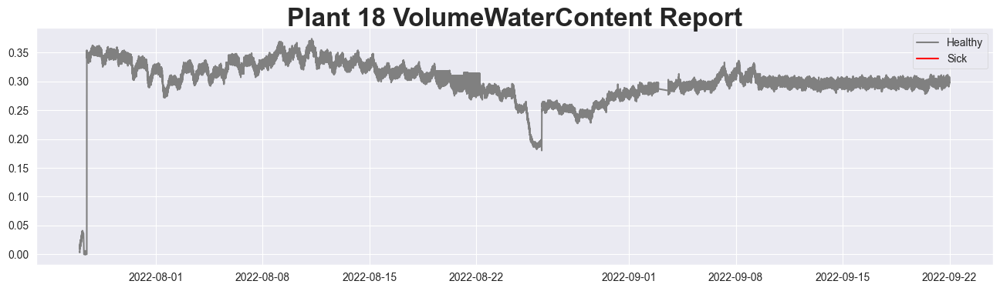

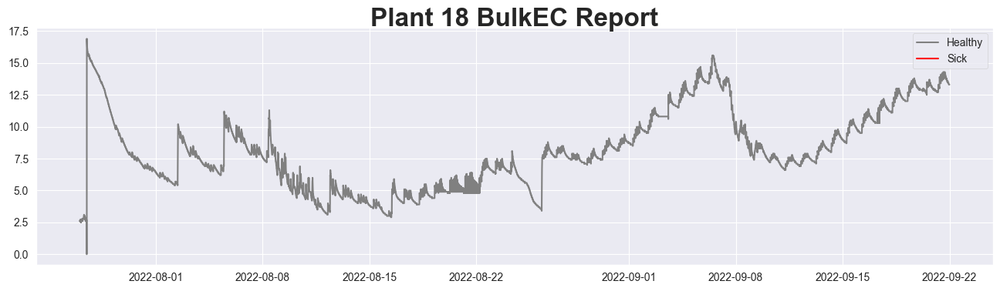

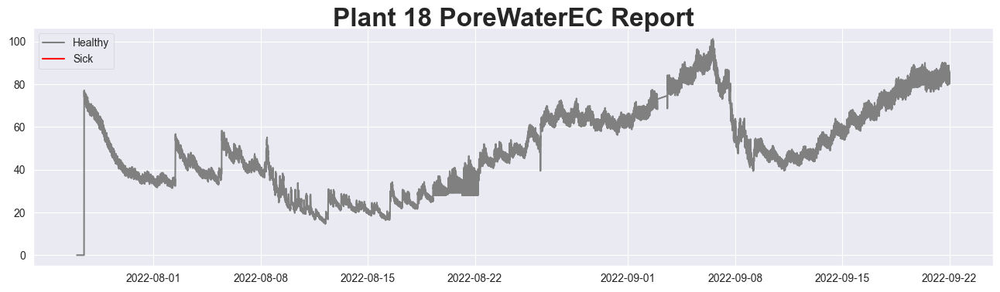

In [24]:
for plant in range(1, 19):
    for feature in num_vars:
        disease_plot(plant=plant, feature=feature)

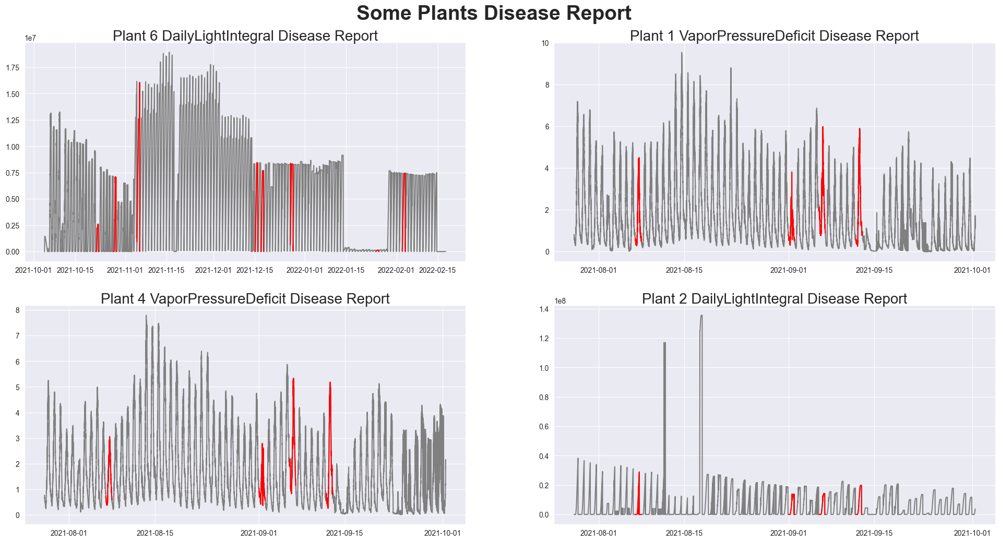

In [27]:
import string
import random

indexes = random.sample([(plant, num_var) for plant in range(1, 9) for num_var in num_vars], 4)
indexes = np.array(indexes).reshape(2, 2, 2)

fig, ax = plt.subplots(2, 2, figsize=(24, 12))

for i in range(len(indexes)):
     for j in range(len(indexes[i])):
            plant = indexes[i, j][0]
            feature = indexes[i, j][1]
            plant_data = disease_df.query(f'Plant == {plant}')
            
            x = plant_data.DateTime
            y = plant_data[feature]
            ax[i, j].plot(x, y, color='gray')
    
            y = np.ma.masked_where(plant_data['Disease'] == 0, plant_data[feature])
            ax[i, j].plot(x, y, color='red')
        
            ax[i, j].set_title(f'Plant {plant} {feature} Disease Report', y=.99, fontsize=20, fontweight=400)

plt.suptitle('Some Plants Disease Report', y=.94, fontsize=28, fontweight=800)
suffix = ''.join([random.choice(string.ascii_lowercase) for i in range(8)])
plt.savefig(f'some_plants_disease_report_{suffix}.png')
plt.show()

## Correlation matrix

### Standardization

In [28]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
standardized = scaler.fit_transform(disease_df[num_vars])
standardized = pd.DataFrame(standardized, columns=num_vars)
standardized.head()

,PAR,DailyLightIntegral,Temperature,RH,VaporPressureDeficit,SoilTemperature,Permittivity,RawEC,VolumeWaterContent,BulkEC,PoreWaterEC
0,-0.585899,-0.482978,-0.397086,0.18884,-0.408789,0.229372,-0.970692,-0.842579,-1.030368,-0.842579,-1.125236
1,-0.585899,-0.482978,-0.397086,0.18884,-0.408789,0.425944,-0.942508,-0.753588,-1.044209,-0.753588,-1.125236
2,-0.585899,-0.482978,-0.401662,0.18884,-0.408789,0.229372,-0.995744,-0.842579,-1.078810,-0.842579,-1.125236
3,-0.585899,-0.482978,-0.401662,0.18884,-0.408789,0.421671,-0.920587,-0.753588,-1.002686,-0.753588,-1.125236
4,-0.585899,-0.482978,-0.409289,0.18884,-0.416759,0.222962,-0.987394,-0.842579,-1.058049,-0.842579,-1.125236


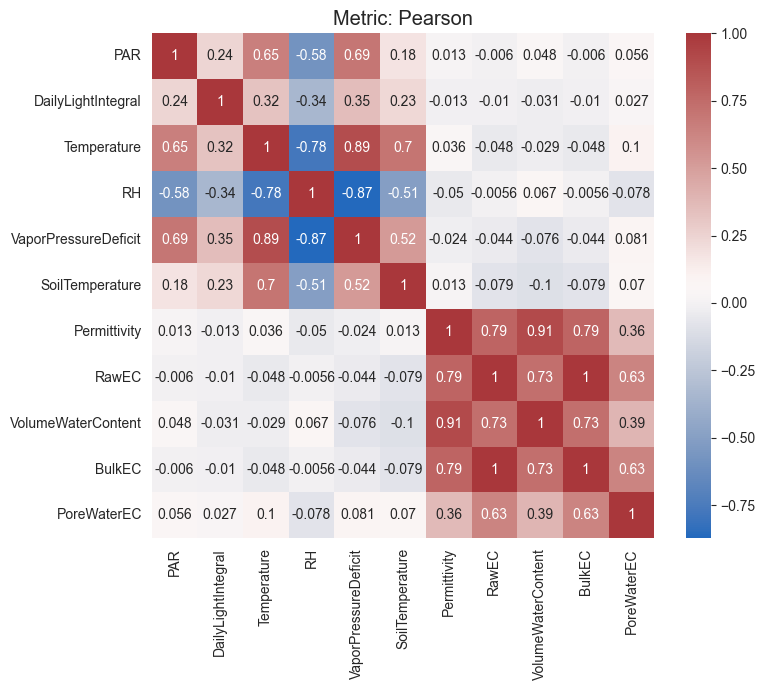

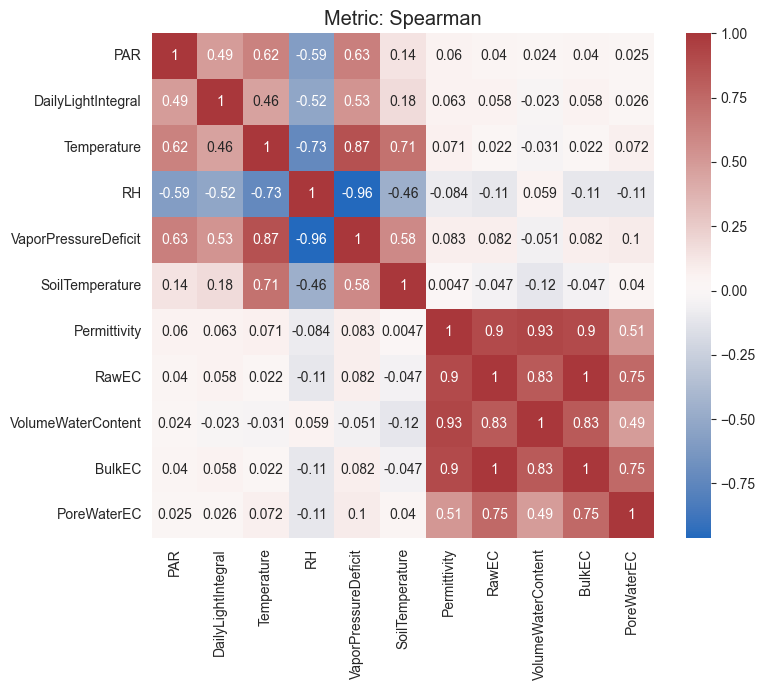

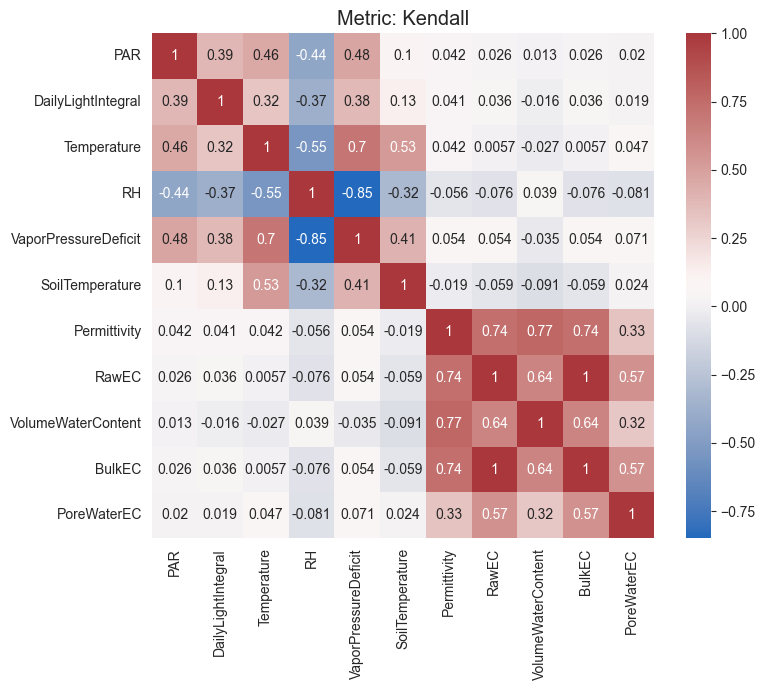

In [39]:
for method in ['pearson', 'spearman', 'kendall']:
    plt.figure(figsize=(8, 7))
    sns.heatmap(standardized.corr(method=method), annot=True, cmap='vlag')
    plt.title(f'Metric: {method.title()}')
    plt.tight_layout()
    plt.savefig(f'correlation_matrixes_for_{method}_metric.png')
    plt.show()